In [1]:
import pickle
from typing import Any, Callable, Dict, List, Optional, Tuple, Union
import torch.nn.functional as F
import torch
import numpy as np
import os

from torchvision import datasets
from torchvision import transforms
import torchvision.transforms as T

import matplotlib.pyplot as plt
import pandas as pd

from numpy import genfromtxt

from PIL import Image

import random

# import visiondataset
from torchvision.datasets import VisionDataset
import pandas as pd

class MyDataset(VisionDataset):
    def __init__(
        self,
        root: str = ".",
        transform: Optional[Callable] = None,
        target_transform: Optional[Callable] = None,
        download: bool = False,
        normalize: Tuple[float, float] = None,
    ) -> None:
        super().__init__(root, transform=transform, target_transform=target_transform)

        self.labels = [ 'tg', 'Ng', 'Pci', 'H', 'Wp', 'Ph', 'Ox', 'Ow', 'Hbt', 'Wm', 'Wr' ]
        self.ids, self.data, self.features = self._load_data(root, ij=normalize)

    def __getitem__(self, index: int) -> Tuple[Any, Any]:
        """
        Args:
            index (int): Index

        Returns:
            tuple: (image, target) where target is index of the target class.
        """
        # id, img, features = self.ids[index], self.data[index], self.features.iloc[index]
        img, features = self.data[index], torch.Tensor(self.features.iloc[index])

        # doing this so that it is consistent with all other datasets
        # to return a PIL Image
        # img = Image.fromarray(img.numpy().astype(np.uint8))
        

        img = img.reshape(pixels, pixels)
        if self.transform is not None:
            img = self.transform(img)

        if self.target_transform is not None:
            target = self.target_transform(target)
        img = img.reshape(pixels**2, -1)

        return img, features

    def __len__(self) -> int:
        return len(self.data)
    
    def _load_data(self, root: str, ij: Tuple[float, float]):
        ids = pd.read_csv(f'{root}/PD_ids_train.csv')
        data = pd.read_csv(f'{root}/PD_imgs_np_train.csv')
        features = pd.read_csv(f'{root}/PD_conditions_train.csv')

        # convert all to list
        # TODO something better than a list
        ids = ids.values.tolist()
        data = data.values.tolist()
        features = features.values.tolist()

        # resize the data now
        # TODO hmmmm
        data = torch.Tensor(data)
        # TODO the first byte is bad
        # remove the first column
        data = data[:, 1:]
        # data = data.reshape(len(data), 140, 39).float()
        # TODO do this properly

        # add 16 bytes of padding
        # data = F.pad(data, (0, 16), value=0)
        # data = data.reshape(len(data), 74, 74).float()
        # print(data.shape)
        # # upscale to 128x128
        data = data.reshape(len(data), 140, 39).float()
        # data = F.interpolate(data.unsqueeze(1), size=(128, 128), mode='nearest').squeeze(1)
        # data = F.interpolate(data.unsqueeze(1), size=(128, 39), mode='nearest').squeeze(1)
        # data = F.pad(data, (0, 128-39), value=0)
        # data = F.pad(data, (0, 64-39), value=0)
        # data = F.interpolate(data.unsqueeze(1), size=(140, 39*3), mode='nearest').squeeze(1)
        # data = F.interpolate(data.unsqueeze(1), size=(64, 64), mode='nearest').squeeze(1)
        # batch x pixels x pixels
        # data = F.pad(data, (0, pixels-39, 0, pixels-140), value=0)
        # repeat every pixel 3 times along the width
        """
        [1, 2, 3] => [1, 1, 1, 2, 2, 2, 3, 3, 3]
        """
        data = data.repeat_interleave(3, dim=2)
        # print the first row of the first image
        data = F.pad(data, (0, pixels-117), value=0)
        data = F.interpolate(data.unsqueeze(1), size=(pixels, pixels), mode='nearest').squeeze(1)


        data = 2 * (data / 255) - 1
        # print(data.shape)
        # print(data[0, 5, :])

        # 140x39 => 140*39=2^n^2 => sqrt(140*39) = 2^n => 73.8918128076 = 2^n => log2(ceil(73.8918128076)) = n => ceil(6.2094533656) = n
        # -_- i dont want nearest base2, but nearest square
        # 140*39 => ceil(sqrt(140*39)) = 74
        # way less fun, but better
        # 140*39 - 74*74 = 16B of padding

        # data = F.interpolate(data.unsqueeze(1), size=(128, 39), mode='nearest').squeeze(1)
        # TODO what
        data = data.reshape(len(data), -1)
        # data = F.pad(data, (0, 4), value=-1)

        # NOTE convert features to dtype f32 for mps
        features = pd.DataFrame(features, columns=self.labels).astype('float32')

        if ij is not None:
            # drop fields that are not used
            features = features.drop(columns=['H', 'Wp', 'Wm', 'Wr'])

            # NOTE: (-1, 1) => y = 2 * (x - min) / (max - min) - 1
            #       ( i, j) => y = (j-i) * (x - min) / (max - min) + i
            features = (ij[1] - ij[0]) * (features - features.min()) / (features.max() - features.min()) + ij[0]
            # NOTE: they are nan because the min and max are the same, std is 0 (and mean is normally NaN); so we can just set them to 0
            features = features.fillna(0)

        return ids, data, features

In [2]:

from torch.utils.data import TensorDataset, DataLoader

import torch.optim as optim 
import torch.nn as nn


import torch.nn.functional as F

from torch.autograd import Variable

from fastai.vision.all import *
from fastai.vision.gan import *

from fastai.callback.all import *

In [3]:
channels = 1 ## 1 for B&W, 3 for RGB, 4 for RGBA
pixels = 128

learning_rate    = 2e-4 #0.003  ## Adam default   ## 0.001 2e-4#
batch_size       = 16
N_Epochs         = 3000 #4_000  ##27000  
num_classes = 1
width = 39
height = 140
img_size = width*height*channels
certainty_repeater = 6# channels**2 - num_classes

print(f"{img_size}")

if torch.cuda.is_available():
    device = torch.device('cuda')
    # get number of cuda devices
    print(f"devices: {torch.cuda.device_count()}")
    print(f"device:  {torch.cuda.get_device_name()}")
    print(f"device0: {torch.cuda.get_device_properties(0)}")
    print(f"{torch.cuda.memory_summary()}")
elif torch.backends.mps is not None:
    device = torch.device('mps')
    print(f"{torch.mps.current_allocated_memory()}")
    os.environ['PYTORCH_ENABLE_MPS_FALLBACK'] = '1'
else:
    device = torch.device('cpu')
    # print a warning that cpu is being used
    print("Warning: Running on CPU. This will be slow.")
print(f"{device}")

5460
devices: 1
device:  NVIDIA A30
device0: _CudaDeviceProperties(name='NVIDIA A30', major=8, minor=0, total_memory=24049MB, multi_processor_count=56)
|===========================================================================|
|                  PyTorch CUDA memory summary, device ID 0                 |
|---------------------------------------------------------------------------|
|            CUDA OOMs: 0            |        cudaMalloc retries: 0         |
|===========================================================================|
|        Metric         | Cur Usage  | Peak Usage | Tot Alloc  | Tot Freed  |
|---------------------------------------------------------------------------|
| Allocated memory      |       0 B  |       0 B  |       0 B  |       0 B  |
|       from large pool |       0 B  |       0 B  |       0 B  |       0 B  |
|       from small pool |       0 B  |       0 B  |       0 B  |       0 B  |
|-------------------------------------------------------------------

In [4]:
def last_checkpoint(starter: str):
    return max([ f"checkpoint/{f}" for f in os.listdir('checkpoint') if f.startswith(starter) ], key=os.path.getctime)

G_model     =  basic_generator(pixels, in_sz=100+7*3, n_channels=channels, n_extra_layers=1).to(device)

# get the checkpoint with the latest date
checkpoint = last_checkpoint('G_')

# G_692 - basic, 128
G_model.load_state_dict(torch.load(f"{checkpoint}"))
print(f"loaded {checkpoint}")

losses = torch.load(last_checkpoint('l_'))

metrics = torch.load(last_checkpoint('m_'))
# plot_metric_per_epoch(metrics)

fakes = torch.load(last_checkpoint('f_'))
print(len(fakes), len(fakes[0]))

loaded checkpoint/G_1833.pt
84 100


In [5]:
dataset = MyDataset(root='data', normalize=(-1, 1))
train_dataset, test_dataset = torch.utils.data.random_split(dataset, [0.85, 0.15], generator=torch.Generator().manual_seed(42))

# define the dataloader
dl_train = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
dl_test = DataLoader(test_dataset, batch_size=batch_size, shuffle=True)

In [6]:
def random_G_vector_input():
    rand_vec = torch.randn( 100 ).to(device)
    return rand_vec

checkpoint/1833


/apps/spack/scholar/fall20/apps/anaconda/2020.02-py37-gcc-4.8.5-mmvdvsv/lib/python3.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


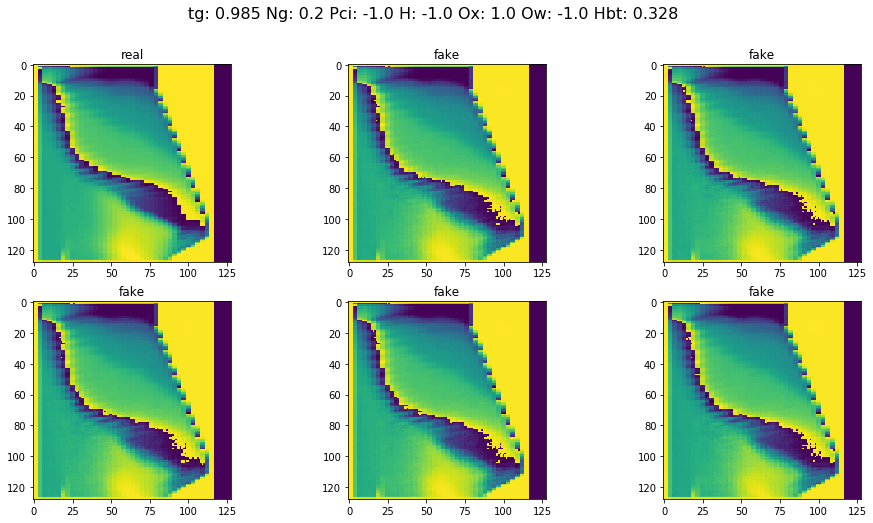

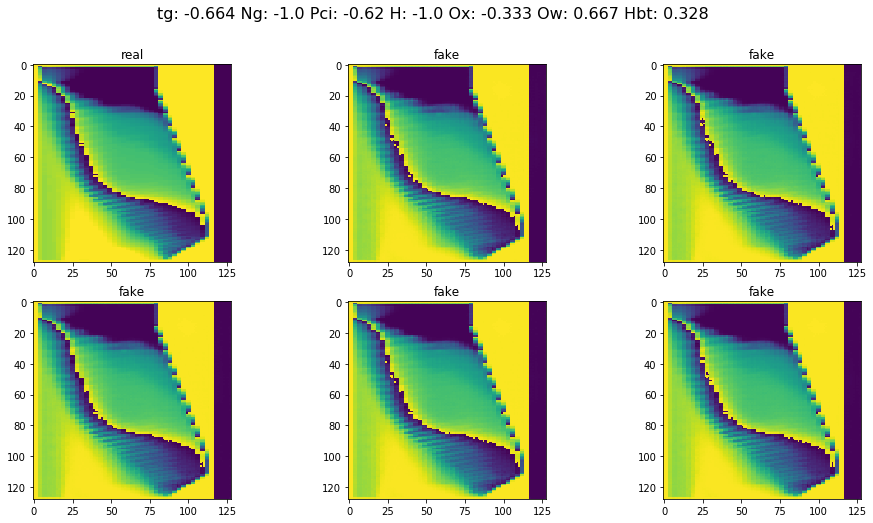

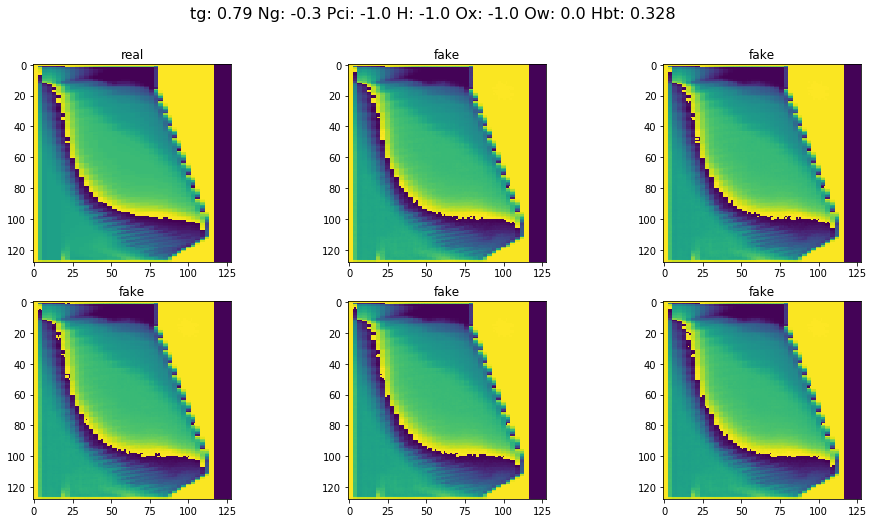

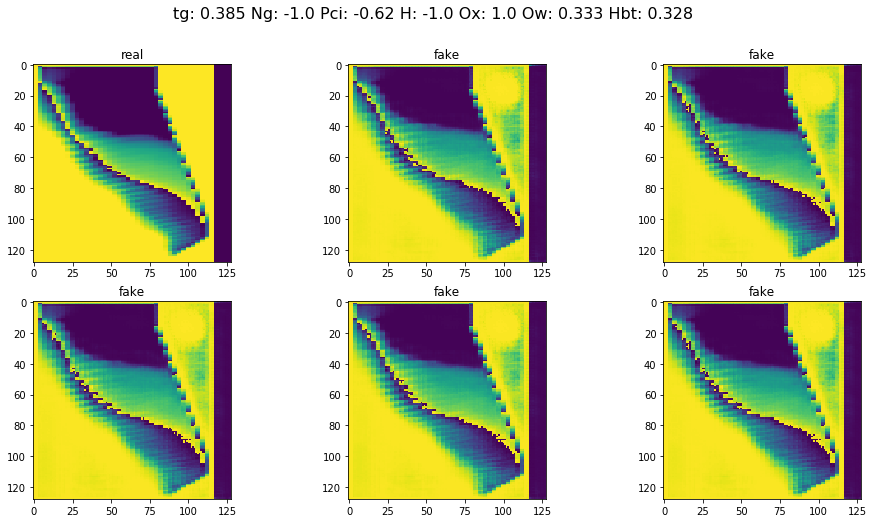

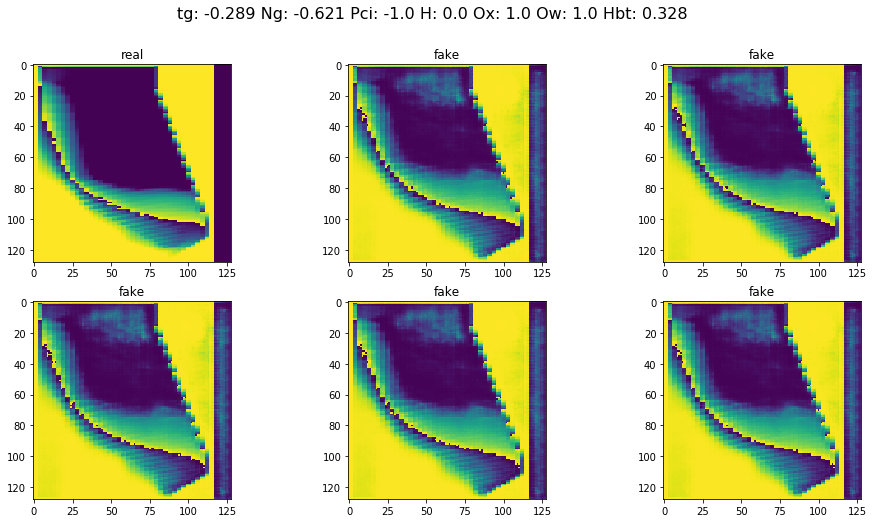

...

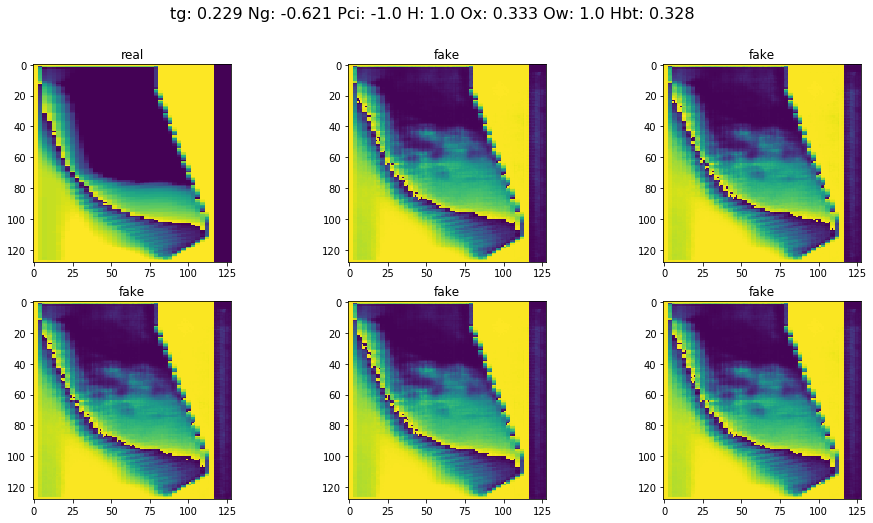

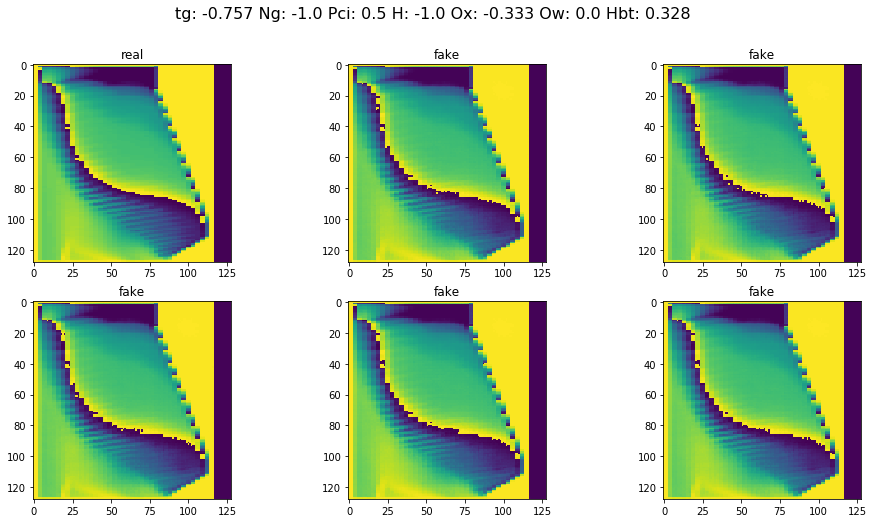

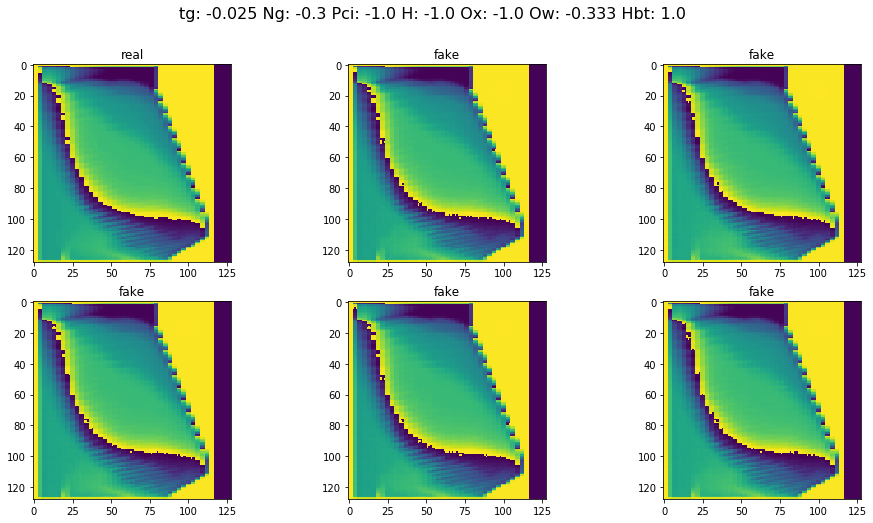

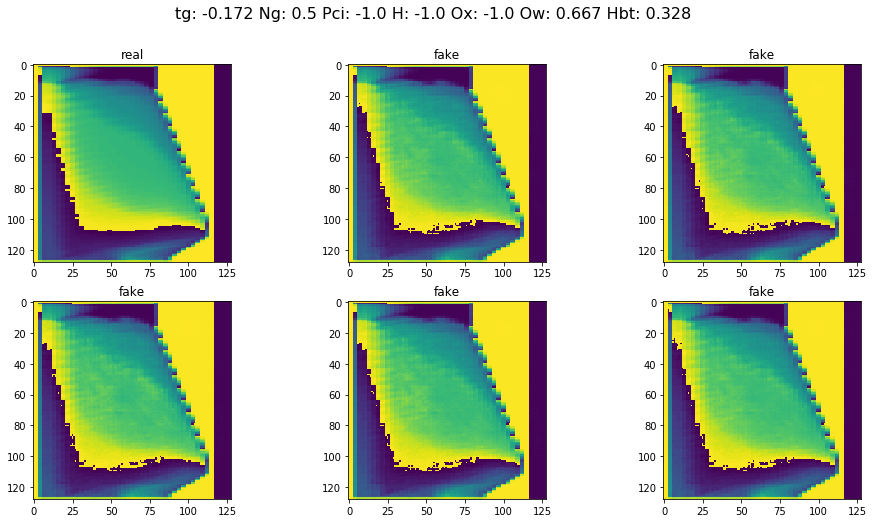

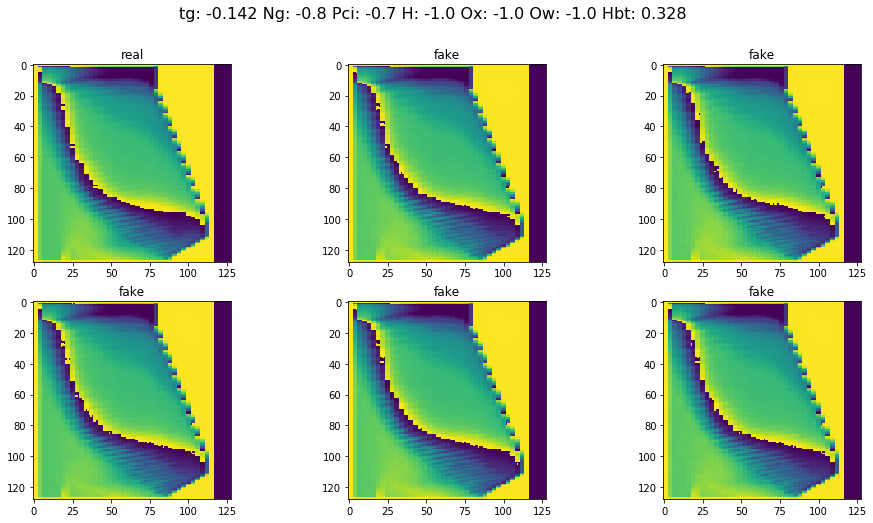

In [7]:
feats = [ 'tg', 'Ng', 'Pci', 'H', 'Ox', 'Ow', 'Hbt' ]
test = [ x for x in test_dataset ]

epoch = checkpoint.split('.')[0].replace('G_','')
print(epoch)

for k in range(len(test)):
    f, axarr = plt.subplots(2,3, figsize=(16,8))

    real = torch.Tensor(test[k][0]).to(device).reshape(1, -1, pixels, pixels)
    labels = torch.Tensor(test[k][1]).repeat(1, 3).to(device)

    for i in range(2):
        for j in range(3):
            if i == 0 and j == 0:
                img = real[0].detach().cpu().numpy()
            else:
                rand = random_G_vector_input().unsqueeze(0)

                label = labels[0].to(device).unsqueeze(0)
                noise = torch.cat( (rand, label) , dim=1)
                fake = G_model.forward( noise ).cpu()
                img = fake.squeeze(0).detach().numpy()

                img = img.reshape(-1).reshape(-1, pixels, pixels)
            img = Image.fromarray((img * 255).astype(np.uint8)[0], mode='L')
            # display the image
            # plt.imshow(img)
            axarr[i,j].set_title("real" if i == 0 and j == 0 else "fake")
            axarr[i,j].imshow(img)

    # the title is the names of the features and the value of them (label and remove the repeat)
    f.suptitle(' '.join([ f"{f}: {round(l.item(), 3)}" for f, l in zip(feats, labels[0][:len(feats)]) ]), fontsize=16)